In [1]:
import torch
import torchvision
import torch.nn as nn

import torch.nn.functional as F
import matplotlib.gridspec as gridspec

from PIL import Image
from matplotlib import pyplot as plt
from torchvision.transforms.functional import pil_to_tensor
from torchvision.transforms import ToTensor, Normalize, Resize
from torchvision.io import read_image
import numpy as np
from scipy.signal.windows import gaussian

import torchvision.transforms as transforms

In [2]:
def imsc(img, *args, quiet=False, lim=None, interpolation='lanczos', **kwargs):
    if isinstance(img, Image.Image):
        img = pil_to_tensor(img)
    handle = None
    with torch.no_grad():
        if not lim:
            lim = [img.min(), img.max()]
        img = img - lim[0]  # also makes a copy
        img.mul_(1 / (lim[1] - lim[0]))
        img = torch.clamp(img, min=0, max=1)
        if not quiet:
            bitmap = img.expand(3,
                                *img.shape[1:]).permute(1, 2, 0).cpu().numpy()
    return bitmap

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

def imagenet_image_transforms(device: str, new_shape_of_image: int = 224):
    """
    Returns transformations that takes a torch tensor and transforms it into a new tensor
    of size (1, C, new_shape_of_image, new_shape_of_image), normalizes the image according
    to the statistics from the Imagenet dataset, and puts the tensor on the desired device.
    """
    transform = torchvision.transforms.Compose([
        torchvision.transforms.Resize((new_shape_of_image, new_shape_of_image)),
        torchvision.transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
        torchvision.transforms.Lambda(unsqeeze_image),
        ToDevice(device),
    ])

    return transform


# Function that opens image from disk, normalizes it and converts to tensor
read_tensor = transforms.Compose([
    lambda x: Image.open(x).convert('RGB'),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                          std=[0.229, 0.224, 0.225]),
    lambda x: torch.unsqueeze(x, 0).to('cuda')
])


read_img = transforms.Compose([
    lambda x: Image.open(x),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    lambda x: x.to('cuda')
])

In [3]:
class ToDevice(torch.nn.Module):
    """
    Sends the input object to the device specified in the
    object's constructor by calling .to(device) on the object.
    """
    def __init__(self, device):
        super().__init__()
        self.device = device

    def forward(self, img):
        return img.to(self.device)

    def __repr__(self) -> str:
        return f"{self.__class__.__name__}(device={self.device})"

def unsqeeze_image(input_image: torch.Tensor) -> torch.Tensor:
    return input_image.unsqueeze(0)

In [4]:
import torch
from torchvision.models import resnet50, ResNet50_Weights

import torchvision

import torch.nn as nn

def load_model(name,path=None):
    if name == 'supervised':
        supervised = torchvision.models.resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)

        supervised = torch.nn.Sequential(*(list(supervised.children())[:-1]))
        model = nn.Sequential(supervised,
                              nn.Flatten()).to('cuda')
    elif name == 'simclr':

        simclr = torchvision.models.resnet50(pretrained=False)
        simclr.fc = nn.Identity()
        simclr.load_state_dict(torch.load('converted_vissl_simclr1000ep.torch'))
        model = nn.Sequential(simclr,
                                  nn.Flatten()).to('cuda')

    elif name == 'predictor':
        supervised = torchvision.models.resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)
        supervised = nn.Sequential(supervised, nn.Softmax(dim=1))
        supervised = supervised.eval()
        supervised = supervised.cuda()
        model = supervised


    elif name == 'simclr_100':

        simclr100 = torchvision.models.resnet50(pretrained=False)
        simclr100.fc = nn.Identity()
        simclr100.load_state_dict(torch.load('converted_vissl_simclr100ep.torch'))
        model = nn.Sequential(simclr100,
                                  nn.Flatten()).to('cuda')
    elif name == 'simclr_200':
        simclr200 = torchvision.models.resnet50(pretrained=False)
        simclr200.fc = nn.Identity()
        simclr200.load_state_dict(torch.load('converted_vissl_simclr200ep.torch'))
        model = nn.Sequential(simclr200,
                                  nn.Flatten()).to('cuda')

    elif name == 'simclr_400':
        simclr400 = torchvision.models.resnet50(pretrained=False)
        simclr400.fc = nn.Identity()
        simclr400.load_state_dict(torch.load('converted_vissl_simclr400ep.torch'))
        model = nn.Sequential(simclr400,
                                  nn.Flatten()).to('cuda')

    elif name == 'simclr_800':
        simclr800 = torchvision.models.resnet50(pretrained=False)
        simclr800.fc = nn.Identity()
        simclr800.load_state_dict(torch.load('converted_vissl_simclr800ep.torch'))
        model = nn.Sequential(simclr800,
                                  nn.Flatten()).to('cuda')
    elif name == 'path':
        pathmodel = torchvision.models.resnet50(pretrained=False)
        pathmodel.fc = nn.Identity()
        pathmodel.load_state_dict(torch.load(path))
        model = nn.Sequential(pathmodel,
                                  nn.Flatten()).to('cuda')



    else:
        raise ValueError('Invalid model name')
    return model

In [5]:
grayscale_trans = transforms.Grayscale()


def grayscale(img):
    img = grayscale_trans(img)
    img = img.repeat(1, 3, 1, 1)
    return img


#blur = transforms.GaussianBlur((5, 5), sigma=(3, 4.0))
blur = transforms.GaussianBlur((5, 5), sigma=(3, 4.0))


class Net(nn.Module):
    def __init__(self, threshold=10.0, use_cuda=False):
        super(Net, self).__init__()

        self.threshold = threshold
        self.use_cuda = use_cuda

        filter_size = 5
        generated_filters = gaussian(filter_size, std=1.0).reshape([1, filter_size])

        self.gaussian_filter_horizontal = nn.Conv2d(in_channels=1, out_channels=1, kernel_size=(1, filter_size),
                                                    padding=(0, filter_size // 2))
        self.gaussian_filter_horizontal.weight.data.copy_(torch.from_numpy(generated_filters))
        self.gaussian_filter_horizontal.bias.data.copy_(torch.from_numpy(np.array([0.0])))
        self.gaussian_filter_vertical = nn.Conv2d(in_channels=1, out_channels=1, kernel_size=(filter_size, 1),
                                                  padding=(filter_size // 2, 0))
        self.gaussian_filter_vertical.weight.data.copy_(torch.from_numpy(generated_filters.T))
        self.gaussian_filter_vertical.bias.data.copy_(torch.from_numpy(np.array([0.0])))

        sobel_filter = np.array([[1, 0, -1],
                                 [2, 0, -2],
                                 [1, 0, -1]])

        self.sobel_filter_horizontal = nn.Conv2d(in_channels=1, out_channels=1, kernel_size=sobel_filter.shape,
                                                 padding=sobel_filter.shape[0] // 2)
        self.sobel_filter_horizontal.weight.data.copy_(torch.from_numpy(sobel_filter))
        self.sobel_filter_horizontal.bias.data.copy_(torch.from_numpy(np.array([0.0])))
        self.sobel_filter_vertical = nn.Conv2d(in_channels=1, out_channels=1, kernel_size=sobel_filter.shape,
                                               padding=sobel_filter.shape[0] // 2)
        self.sobel_filter_vertical.weight.data.copy_(torch.from_numpy(sobel_filter.T))
        self.sobel_filter_vertical.bias.data.copy_(torch.from_numpy(np.array([0.0])))

        # filters were flipped manually
        filter_0 = np.array([[0, 0, 0],
                             [0, 1, -1],
                             [0, 0, 0]])

        filter_45 = np.array([[0, 0, 0],
                              [0, 1, 0],
                              [0, 0, -1]])

        filter_90 = np.array([[0, 0, 0],
                              [0, 1, 0],
                              [0, -1, 0]])

        filter_135 = np.array([[0, 0, 0],
                               [0, 1, 0],
                               [-1, 0, 0]])

        filter_180 = np.array([[0, 0, 0],
                               [-1, 1, 0],
                               [0, 0, 0]])

        filter_225 = np.array([[-1, 0, 0],
                               [0, 1, 0],
                               [0, 0, 0]])

        filter_270 = np.array([[0, -1, 0],
                               [0, 1, 0],
                               [0, 0, 0]])

        filter_315 = np.array([[0, 0, -1],
                               [0, 1, 0],
                               [0, 0, 0]])

        all_filters = np.stack(
            [filter_0, filter_45, filter_90, filter_135, filter_180, filter_225, filter_270, filter_315])

        self.directional_filter = nn.Conv2d(in_channels=1, out_channels=8, kernel_size=filter_0.shape,
                                            padding=filter_0.shape[-1] // 2)
        self.directional_filter.weight.data.copy_(torch.from_numpy(all_filters[:, None, ...]))
        self.directional_filter.bias.data.copy_(torch.from_numpy(np.zeros(shape=(all_filters.shape[0],))))

    def forward(self, img):
        img_r = img[:, 0:1]
        img_g = img[:, 1:2]
        img_b = img[:, 2:3]

        blur_horizontal = self.gaussian_filter_horizontal(img_r)
        blurred_img_r = self.gaussian_filter_vertical(blur_horizontal)
        blur_horizontal = self.gaussian_filter_horizontal(img_g)
        blurred_img_g = self.gaussian_filter_vertical(blur_horizontal)
        blur_horizontal = self.gaussian_filter_horizontal(img_b)
        blurred_img_b = self.gaussian_filter_vertical(blur_horizontal)

        blurred_img = torch.stack([blurred_img_r, blurred_img_g, blurred_img_b], dim=1)
        blurred_img = torch.stack([torch.squeeze(blurred_img)])

        grad_x_r = self.sobel_filter_horizontal(blurred_img_r)
        grad_y_r = self.sobel_filter_vertical(blurred_img_r)
        grad_x_g = self.sobel_filter_horizontal(blurred_img_g)
        grad_y_g = self.sobel_filter_vertical(blurred_img_g)
        grad_x_b = self.sobel_filter_horizontal(blurred_img_b)
        grad_y_b = self.sobel_filter_vertical(blurred_img_b)

        # COMPUTE THICK EDGES

        grad_mag = torch.sqrt(grad_x_r ** 2 + grad_y_r ** 2)
        grad_mag += torch.sqrt(grad_x_g ** 2 + grad_y_g ** 2)
        grad_mag += torch.sqrt(grad_x_b ** 2 + grad_y_b ** 2)
        grad_orientation = (
                    torch.atan2(grad_y_r + grad_y_g + grad_y_b, grad_x_r + grad_x_g + grad_x_b) * (180.0 / 3.14159))
        grad_orientation += 180.0
        grad_orientation = torch.round(grad_orientation / 45.0) * 45.0

        # THIN EDGES (NON-MAX SUPPRESSION)

        all_filtered = self.directional_filter(grad_mag)

        inidices_positive = (grad_orientation / 45) % 8
        inidices_negative = ((grad_orientation / 45) + 4) % 8

        height = inidices_positive.size()[2]
        width = inidices_positive.size()[3]
        pixel_count = height * width
        pixel_range = torch.FloatTensor([range(pixel_count)])
        if self.use_cuda:
            pixel_range = torch.cuda.FloatTensor([range(pixel_count)])

        indices = (inidices_positive.view(-1).data * pixel_count + pixel_range).squeeze()
        channel_select_filtered_positive = all_filtered.view(-1)[indices.long()].view(1, height, width)

        indices = (inidices_negative.view(-1).data * pixel_count + pixel_range).squeeze()
        channel_select_filtered_negative = all_filtered.view(-1)[indices.long()].view(1, height, width)

        channel_select_filtered = torch.stack([channel_select_filtered_positive, channel_select_filtered_negative])

        is_max = channel_select_filtered.min(dim=0)[0] > 0.0
        is_max = torch.unsqueeze(is_max, dim=0)

        thin_edges = grad_mag.clone()
        thin_edges[is_max == 0] = 0.0

        # THRESHOLD

        thresholded = thin_edges.clone()
        thresholded[thin_edges < self.threshold] = 0.0

        early_threshold = grad_mag.clone()
        early_threshold[grad_mag < self.threshold] = 0.0

        assert grad_mag.size() == grad_orientation.size() == thin_edges.size() == thresholded.size() == early_threshold.size()
        # blurred_img, grad_mag, grad_orientation, thin_edges, thresholded, early_threshold
        edges=thin_edges.repeat(1, 3, 1, 1)
        edges = (edges.max() - edges) / edges.max()
        return edges, early_threshold.repeat(1, 3, 1, 1)


use_cuda = True

edge_detect = Net(threshold=3.0, use_cuda=use_cuda)
if use_cuda:
    edge_detect.cuda()
edge_detect.eval()



Net(
  (gaussian_filter_horizontal): Conv2d(1, 1, kernel_size=(1, 5), stride=(1, 1), padding=(0, 2))
  (gaussian_filter_vertical): Conv2d(1, 1, kernel_size=(5, 1), stride=(1, 1), padding=(2, 0))
  (sobel_filter_horizontal): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (sobel_filter_vertical): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (directional_filter): Conv2d(1, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)

In [6]:
def mask_generator(
    batch_size: int,
    shape: tuple,
    device: str,
    num_cells: int = 7,
    probablity_of_drop: float = 0.5,
    num_spatial_dims: int = 2) -> torch.Tensor:
    """
    Generates a batch of masks by sampling Bernoulli random variables (probablity_of_drop) in a lower dimensional grid (num_cells)
    and upsamples the discrete masks using bilinear interpolation to obtain smooth continious mask in (0, 1).
    """

    pad_size = (num_cells // 2, num_cells // 2, num_cells // 2, num_cells // 2)

    grid = (torch.rand(batch_size, 1, *((num_cells,) * num_spatial_dims), device=device) < probablity_of_drop).float()
    grid_up = F.interpolate(grid, size=(shape), mode='bilinear', align_corners=False)
    grid_up = F.pad(grid_up, pad_size, mode='reflect')

    shift_x = torch.randint(0, num_cells, (batch_size,), device=device)
    shift_y = torch.randint(0, num_cells, (batch_size,), device=device)

    masks = torch.empty((batch_size, 1, shape[0], shape[1]), device=device)

    for mask_i in range(batch_size):
        masks[mask_i] = grid_up[
            mask_i,
            :,
            shift_x[mask_i]:shift_x[mask_i] + shape[0],
            shift_y[mask_i]:shift_y[mask_i] + shape[1]
        ]

    yield masks
import torchvision.transforms as transforms



def binary_mask_generator(
    batch_size: int,
    shape: tuple,
    device: str,
    num_cells: int = 14,
    probablity_of_drop: float = 0.7,
    num_spatial_dims: int = 2) -> torch.Tensor:
    """
    Generates a batch of masks by sampling Bernoulli random variables (probablity_of_drop) in a lower dimensional grid (num_cells)
    and upsamples the discrete masks using bilinear interpolation to obtain smooth continious mask in (0, 1).
    """
    crop = transforms.RandomResizedCrop(size=shape,scale=(0.1, 0.5))

    pad_size = (num_cells // 2, num_cells // 2, num_cells // 2, num_cells // 2)

    grid = (torch.rand(batch_size, 1, *((num_cells,) * num_spatial_dims), device=device) < probablity_of_drop).float()
    grid_up = F.interpolate(grid, size=(224*16,224*16), mode='bicubic', align_corners=True)
    masks=crop(grid_up)
    yield masks
    

In [7]:
def low_pass(img):
    low_pass = transforms.GaussianBlur((5, 5), sigma=(3, 4.0))
    img = low_pass(img)
    # img = img.repeat(1, 3, 1, 1)
    return img

def high_pass(img):
    high_pass = transforms.GaussianBlur((5, 5), sigma=(3, 4.0))
    img = high_pass(img)
    # img = img.repeat(1, 3, 1, 1)
    img = (img.max() - img) / img.max()
    return img

In [8]:
import cv2
import torchvision.transforms.functional as TF
import kornia

def adjust_brightness(img):
    # Convert the image to the LAB color space
    img_lab = kornia.color.rgb_to_lab(img)
    
    # Split the LAB image into L, A, and B channels
    L, A, B = img_lab.split(1, dim=1)
    
    # Increase the brightness by adding a constant value to the L channel
    L = L - 0.5
    
    # Clip the values to be in the valid range [0, 100]
    L = torch.clamp(L, 0, 100)
    
    # Merge the channels back together
    img_lab = torch.cat((L, A, B), dim=1)
    
    # Convert back to RGB color space
    img_rgb = kornia.color.lab_to_rgb(img_lab)
    
    return img_rgb

def sharpen_edges(img):
    device = img.device
    # Define a sharpening kernel
    kernel = torch.tensor([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]], dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)
    
    # Apply the kernel to the image
    # Apply the kernel to each channel separately
    img_sharpened = torch.cat([F.conv2d(img[:, i:i+1, :, :], kernel, padding=1) for i in range(img.size(1))], dim=1)
    
    # Clip the values to be in the valid range [0, 1]
    img_sharpened = torch.clamp(img_sharpened, 0, 1)
    
    return img_sharpened


In [9]:
# Define a function to get the depth map of the image uding a pre-trained model
def get_depth_map(img):
    # Load a pre-trained depth estimation model MiDAS
    model = torch.hub.load("intel-isl/MiDaS", "MiDaS_small")

    # Set the model to evaluation mode
    model.eval()
    # Move the model to the same device as the input image
    device = img.device
    model.to(device)
    # Preprocess the image
    transform = torch.hub.load("intel-isl/MiDaS", "transforms").default_transform
    
    # Get the depth map
    with torch.no_grad():
        depth_map = model(img)
        
    # Normalize the depth map to the range [0, 1]
    depth_map = (depth_map - depth_map.min()) / (depth_map.max() - depth_map.min())
    
    return depth_map

def inverse_depth_blurring(img):
    # Invert the depth map
    depth_map = get_depth_map(img)
    # inverted_depth_map = 1 - depth_map
    inverted_depth_map = depth_map
    
    # Apply Gaussian blur to the inverted depth map
    blurred_depth_map = transforms.GaussianBlur((5, 5), sigma=(3, 4.0))(inverted_depth_map)

    gray = grayscale(img)
    
    # Multiply the original image with the blurred depth map
    img_blurred = gray * blurred_depth_map
    
    return img_blurred

In [10]:

BATCH_SIZE=128
NUM_BATCH=64

class RELAX_All(nn.Module):

    def __init__(self,
                 input_image: torch.Tensor,
                 encoder: nn.Module,
                 batch_size: int = BATCH_SIZE,
                 num_batches: int = NUM_BATCH,
                 similarity_measure: nn.Module = nn.CosineSimilarity(dim=1),
                 sum_of_weights_initial_value: float = 1e-10,
                 attributes: list = ['c', 's', 't', 'lf', 'hf', 'b', 'sh', 'd']) -> None:

        super().__init__()

        self.batch_size = batch_size
        self.input_image = input_image
        self.num_batches = num_batches
        self.device = input_image.device
        self.encoder = encoder.to(self.device)
        self.similarity_measure = similarity_measure
        self.shape = tuple(input_image.shape[2:])
        self.attributes = attributes

        self.importance = torch.zeros(self.shape, device=self.device)
        self.texture_importance = torch.zeros(self.shape, device=self.device)
        self.color_importance = torch.zeros(self.shape, device=self.device)
        self.shape_importance = torch.zeros(self.shape, device=self.device)
        self.low_freq_importance = torch.zeros(self.shape, device=self.device)
        self.high_freq_importance = torch.zeros(self.shape, device=self.device)
        self.bright_importance = torch.zeros(self.shape, device=self.device)
        self.sharp_importance = torch.zeros(self.shape, device=self.device)
        self.depth_importance = torch.zeros(self.shape, device=self.device)

        self.sum_of_weights = sum_of_weights_initial_value * torch.ones(self.shape, device=self.device)
        self.texture_sum_of_weights = sum_of_weights_initial_value * torch.ones(self.shape, device=self.device)
        self.color_sum_of_weights = sum_of_weights_initial_value * torch.ones(self.shape, device=self.device)
        self.shape_sum_of_weights = sum_of_weights_initial_value * torch.ones(self.shape, device=self.device)
        self.low_freq_sum_of_weights = sum_of_weights_initial_value * torch.ones(self.shape, device=self.device)
        self.high_freq_sum_of_weights = sum_of_weights_initial_value * torch.ones(self.shape, device=self.device)
        self.bright_sum_of_weights = sum_of_weights_initial_value * torch.ones(self.shape, device=self.device)
        self.sharp_sum_of_weights = sum_of_weights_initial_value * torch.ones(self.shape, device=self.device)
        self.depth_sum_of_weights = sum_of_weights_initial_value * torch.ones(self.shape, device=self.device)


        self.grayscale_input = grayscale(self.input_image)
        self.edge_input, self.edge_mask = edge_detect(self.input_image)
        self.blur_input = blur(self.grayscale_input)
        self.low_freq_input = low_pass(self.input_image)
        self.high_freq_input = high_pass(self.input_image)
        self.bright_input = adjust_brightness(self.input_image)
        self.sharp_input = sharpen_edges(self.input_image)
        self.depth_input = inverse_depth_blurring(self.input_image)

        self.unmasked_representations = encoder(self.input_image).expand(batch_size, -1)
        self.unmasked_grayscale_representations = encoder(self.grayscale_input).expand(batch_size, -1)
        self.unmasked_edge_representations = encoder(self.edge_input).expand(batch_size, -1)

    def forward(self, **kwargs) -> None:

        for i in range(self.num_batches):
            for masks in mask_generator(self.batch_size, self.shape, self.device, **kwargs):

                x_mask = self.input_image * masks
                masked_representations = self.encoder(x_mask)

                similarity_scores = self.similarity_measure(
                    self.unmasked_representations,
                    masked_representations
                )
                for similarity_i, mask_i in zip(similarity_scores, masks.squeeze()):
                    self.sum_of_weights += mask_i

                    self.importance += mask_i * (similarity_i - self.importance) / self.sum_of_weights

            if len(self.attributes) >= 1:
                for masks in binary_mask_generator(self.batch_size, self.shape, self.device, **kwargs):
                    if 't' in self.attributes:
                    ########### Texture ######
                        texture_masks = ((self.edge_mask > 5).float() + masks > 0.5).float()
                        texture_x_mask = texture_masks * self.grayscale_input + (1 - texture_masks) * self.blur_input

                        texture_masked_representations = self.encoder(texture_x_mask)

                        texture_similarity_scores = self.similarity_measure(
                            self.unmasked_grayscale_representations,
                            texture_masked_representations
                        )

                        for similarity_i, mask_i in zip(texture_similarity_scores, masks.squeeze()):
                            self.texture_sum_of_weights += mask_i
                            self.texture_importance += mask_i * (
                                        similarity_i - self.texture_importance) / self.texture_sum_of_weights

                    ########### Color ######
                    if 'c' in self.attributes:
                        color_x_mask = masks * self.input_image + (1 - masks) * self.grayscale_input
                        color_masked_representations = self.encoder(color_x_mask)

                        color_similarity_scores = self.similarity_measure(
                            self.unmasked_representations,
                            color_masked_representations
                        )

                        for similarity_i, mask_i in zip(color_similarity_scores, masks.squeeze()):
                            self.color_sum_of_weights += mask_i
                            self.color_importance += mask_i * (similarity_i - self.color_importance) / self.color_sum_of_weights

                    ########## Shape #########
                    if 's' in self.attributes:
                        shape_x_mask = self.edge_input * masks
                        shape_masked_representations = self.encoder(shape_x_mask)
                        shape_similarity_scores = self.similarity_measure(
                            self.unmasked_edge_representations,
                            shape_masked_representations
                        )

                        for similarity_i, mask_i in zip(shape_similarity_scores, masks.squeeze()):
                            self.shape_sum_of_weights += mask_i
                            self.shape_importance += mask_i * (similarity_i - self.shape_importance) / self.shape_sum_of_weights

                    ########## Low Frequency #########
                    if 'lf' in self.attributes:
                        low_freq_x_mask = masks * self.low_freq_input
                        low_freq_masked_representations = self.encoder(low_freq_x_mask)
                        low_freq_similarity_scores = self.similarity_measure(
                            self.unmasked_grayscale_representations,
                            low_freq_masked_representations
                        )

                        for similarity_i, mask_i in zip(low_freq_similarity_scores, masks.squeeze()):
                            self.low_freq_sum_of_weights += mask_i
                            self.low_freq_importance += mask_i * (
                                        similarity_i - self.low_freq_importance) / self.low_freq_sum_of_weights
                            
                    ########## High Frequency #########
                    if 'hf' in self.attributes:
                        high_freq_x_mask = masks * self.high_freq_input
                        high_freq_masked_representations = self.encoder(high_freq_x_mask)
                        high_freq_similarity_scores = self.similarity_measure(
                            self.unmasked_grayscale_representations,
                            high_freq_masked_representations
                        )

                        for similarity_i, mask_i in zip(high_freq_similarity_scores, masks.squeeze()):
                            self.high_freq_sum_of_weights += mask_i
                            self.high_freq_importance += mask_i * (
                                        similarity_i - self.high_freq_importance) / self.high_freq_sum_of_weights

                    ###### Brightness #########
                    if 'b' in self.attributes:
                        bright_x_mask = masks * self.input_image + (1 - masks) * self.bright_input
                        bright_masked_representations = self.encoder(bright_x_mask)
                        bright_similarity_scores = self.similarity_measure(
                            self.unmasked_representations,
                            bright_masked_representations
                        )

                        for similarity_i, mask_i in zip(bright_similarity_scores, masks.squeeze()):
                            self.bright_sum_of_weights += mask_i
                            self.bright_importance += mask_i * (
                                        similarity_i - self.bright_importance) / self.bright_sum_of_weights

                    ###### Sharpness #########
                    if 'sh' in self.attributes:
                        sharp_x_mask = self.input_image * masks + (1 - masks) * self.sharp_input
                        # sharp_x_mask = self.sharp_input * masks 
                        sharp_masked_representations = self.encoder(sharp_x_mask)
                        sharp_similarity_scores = self.similarity_measure(
                            self.unmasked_representations,
                            sharp_masked_representations
                        )

                        for similarity_i, mask_i in zip(sharp_similarity_scores, masks.squeeze()):
                            self.sharp_sum_of_weights += mask_i
                            self.sharp_importance += mask_i * (
                                        similarity_i - self.sharp_importance) / self.sharp_sum_of_weights
                    
                    ###### Depth #########
                    if 'd' in self.attributes:
                        # depth_x_mask = self.grayscale_input * (1 - masks) + masks * self.depth_input
                        depth_x_mask = masks * self.depth_input
                        depth_masked_representations = self.encoder(depth_x_mask)
                        depth_similarity_scores = self.similarity_measure(
                            self.unmasked_representations,
                            depth_masked_representations
                        )

                        for similarity_i, mask_i in zip(depth_similarity_scores, masks.squeeze()):
                            self.depth_sum_of_weights += mask_i
                            self.depth_importance += mask_i * (
                                        similarity_i - self.depth_importance) / self.depth_sum_of_weights


        self.importance = (self.importance - self.importance.mean()) / self.importance.std()
        self.texture_importance = (
                                              self.texture_importance - self.texture_importance.mean()) / self.texture_importance.std()
        self.color_importance = (self.color_importance - self.color_importance.mean()) / self.color_importance.std()
        self.shape_importance = (self.shape_importance - self.shape_importance.mean()) / self.shape_importance.std()
        self.low_freq_importance = (self.low_freq_importance - self.low_freq_importance.mean()) / self.low_freq_importance.std()
        self.high_freq_importance = (self.high_freq_importance - self.high_freq_importance.mean()) / self.high_freq_importance.std()
        self.bright_importance = (self.bright_importance - self.bright_importance.mean()) / self.bright_importance.std()
        self.sharp_importance = (self.sharp_importance - self.sharp_importance.mean()) / self.sharp_importance.std()
        self.depth_importance = (self.depth_importance - self.depth_importance.mean()) / self.depth_importance.std()

        return None





In [11]:
from torchvision.io import read_image
from PIL import Image
from matplotlib import pyplot as plt
import time


In [12]:

img1=imagenet_image_transforms(device='cuda', new_shape_of_image=224)(read_image('/kaggle/input/cvprojectrelax-images/images/sample1.jpg')/255)
img2=imagenet_image_transforms(device='cuda', new_shape_of_image=224)(read_image('/kaggle/input/cvprojectrelax-images/images/sample2.jpg')/255)
img3=imagenet_image_transforms(device='cuda', new_shape_of_image=224)(read_image('/kaggle/input/cvprojectrelax-images/images/sample3.jpg')/255)

In [13]:
# vicreg=load_model('path','/kaggle/input/cv_relax_models/other/default/1/VICReg.pth')
# supervised=load_model('supervised')
# barlow=load_model('path','/kaggle/input/cv_relax_models/other/default/1/converted_vissl_barlow_twins.torch')

In [14]:
# Loading pre-trained SimCLR model
simclr=load_model('path','/kaggle/input/cv_relax_models/other/default/1/converted_vissl_simclr1000ep.torch')

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/tmp/ipykernel_31/1445885677.py:61: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the function

In [15]:
# Loading pre-trained SwAV model
swav = torch.hub.load('facebookresearch/swav:main', 'resnet50')

Downloading: "https://github.com/facebookresearch/swav/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://dl.fbaipublicfiles.com/deepcluster/swav_800ep_pretrain.pth.tar" to /root/.cache/torch/hub/checkpoints/swav_800ep_pretrain.pth.tar
100%|██████████| 108M/108M [00:03<00:00, 33.8MB/s] 


In [16]:
# run this one time
! mkdir checkpoint
! wget https://dl.fbaipublicfiles.com/moco/moco_checkpoints/moco_v2_800ep/moco_v2_800ep_pretrain.pth.tar -P checkpoint
! wget https://dl.fbaipublicfiles.com/moco/moco_checkpoints/moco_v1_200ep/moco_v1_200ep_pretrain.pth.tar -P checkpoint

--2025-04-30 16:10:44--  https://dl.fbaipublicfiles.com/moco/moco_checkpoints/moco_v2_800ep/moco_v2_800ep_pretrain.pth.tar
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.164.78.121, 18.164.78.72, 18.164.78.128, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|18.164.78.121|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 112133139 (107M) [application/octet-stream]
Saving to: ‘checkpoint/moco_v2_800ep_pretrain.pth.tar’

moco_v2_800ep_pretr 100%[===================>] 106.94M  45.5MB/s    in 2.3s    

2025-04-30 16:10:47 (45.5 MB/s) - ‘checkpoint/moco_v2_800ep_pretrain.pth.tar’ saved [112133139/112133139]

--2025-04-30 16:10:47--  https://dl.fbaipublicfiles.com/moco/moco_checkpoints/moco_v1_200ep/moco_v1_200ep_pretrain.pth.tar
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.164.78.72, 18.164.78.81, 18.164.78.121, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|18.164.78.72|:443... connected.
HTTP 

In [17]:
# Loading pre-trained MoCo model
import torch
import torch.nn as nn
import torchvision.models as models
from PIL import Image
from torchvision import transforms

import matplotlib.pyplot as plt
import numpy as np

device =  torch.device("cuda" if torch.cuda.is_available() else "cpu")

moco = models.__dict__['resnet50']()
moco.fc = nn.Identity()

chpkt = torch.load("/kaggle/working/checkpoint/moco_v2_800ep_pretrain.pth.tar")

state_dict = chpkt['state_dict']
for k in list(state_dict.keys()):
    if k.startswith("module.encoder_q") and not k.startswith("module.encoder_q.fc"):
        # remove prefix
        state_dict[k[len("module.encoder_q.") :]] = state_dict[k]
    # delete renamed or unused k
    del state_dict[k]
msg = moco.load_state_dict(state_dict, strict=False)
moco = moco.to(device)
moco.eval()
print("Model loaded successfully.")
# print(moco)

Model loaded successfully.


/tmp/ipykernel_31/2044991592.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  chpkt = torch.load("/kaggle/working/checkpoint/moco_v2_800ep_pretrain.pth.tar")


/tmp/ipykernel_31/1313486723.py:131: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:78.)
  pixel_range = torch.cuda.FloatTensor([range(pixel_count)])
/usr/local/lib/python3.11/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading

Loading weights:  None


Downloading: "https://github.com/rwightman/gen-efficientnet-pytorch/zipball/master" to /root/.cache/torch/hub/master.zip
Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_lite3-b733e338.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_lite3-b733e338.pth
Downloading: "https://github.com/isl-org/MiDaS/releases/download/v2_1/midas_v21_small_256.pt" to /root/.cache/torch/hub/checkpoints/midas_v21_small_256.pt
100%|██████████| 81.8M/81.8M [00:00<00:00, 236MB/s]
Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


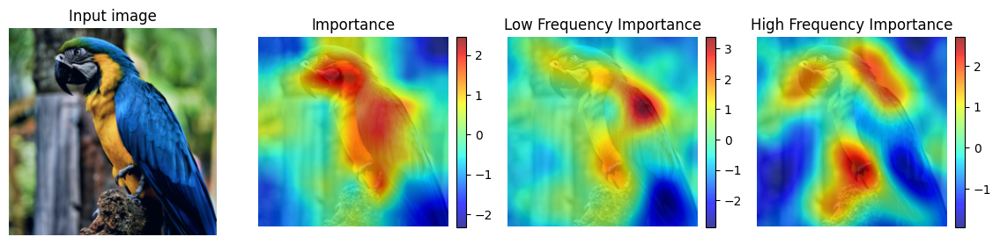

In [18]:
img = img1
encoder1 = simclr
relax1 = RELAX_All(img, encoder1)
with torch.no_grad(): relax1.forward()
    
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 4, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(imsc(img[0].cpu()))
im2 = plt.imshow(relax1.importance.numpy(force=True), alpha=0.75, cmap='jet')
ax2.axis('off')
ax2.set_title(f'Importance')
plt.colorbar(im2, fraction=0.046, pad=0.04)

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(imsc(img[0].cpu()))
im3 = plt.imshow(relax1.low_freq_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax3.axis('off')
ax3.set_title(f'Low Frequency Importance')
plt.colorbar(im3, fraction=0.046, pad=0.04)

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(imsc(img[0].cpu()))
im4 = plt.imshow(relax1.high_freq_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax4.axis('off')
ax4.set_title(f'High Frequency Importance')
plt.colorbar(im4, fraction=0.046, pad=0.04)

# timestr = time.strftime("%Y%m%d-%H%M%S")
    
# plt.savefig("importance_"+timestr+".png")  
plt.show()

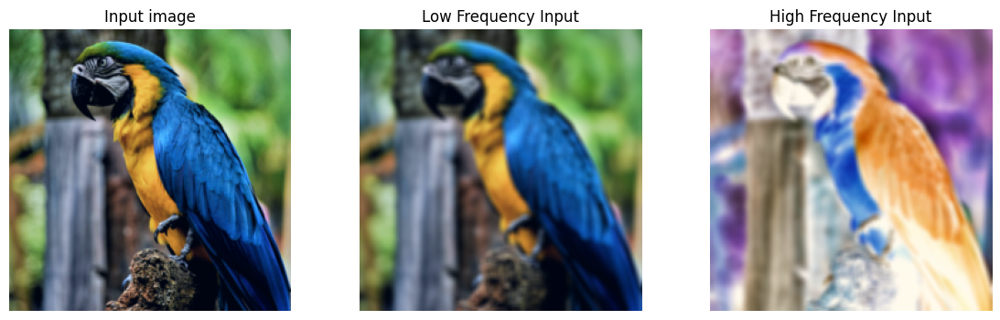

In [19]:
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 3, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 3, 2)
ax2.imshow(imsc(relax1.low_freq_input[0].cpu()))
ax2.axis('off')
ax2.set_title(f'Low Frequency Input')

ax3 = fig.add_subplot(1, 3, 3)
ax3.imshow(imsc(relax1.high_freq_input[0].cpu()))
ax3.axis('off')
ax3.set_title(f'High Frequency Input')
plt.show()

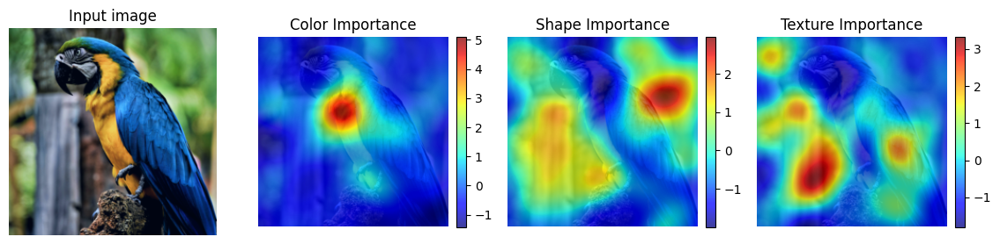

In [20]:
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 4, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(imsc(img[0].cpu()))
im2 = plt.imshow(relax1.color_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax2.axis('off')
ax2.set_title(f'Color Importance')
plt.colorbar(im2, fraction=0.046, pad=0.04)

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(imsc(img[0].cpu()))
im3 = plt.imshow(relax1.shape_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax3.axis('off')
ax3.set_title(f'Shape Importance')
plt.colorbar(im3, fraction=0.046, pad=0.04)

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(imsc(img[0].cpu()))
im4 = plt.imshow(relax1.texture_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax4.axis('off')
ax4.set_title(f'Texture Importance')
plt.colorbar(im4, fraction=0.046, pad=0.04)

# timestr = time.strftime("%Y%m%d-%H%M%S")
    
# plt.savefig("importance_"+timestr+".png")  
plt.show()

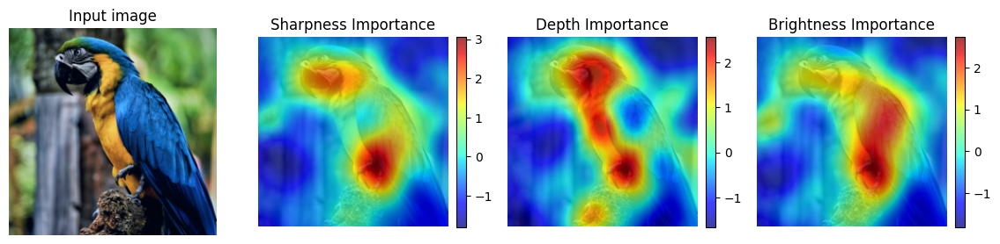

In [21]:
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 4, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(imsc(img[0].cpu()))
im2 = plt.imshow(relax1.sharp_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax2.axis('off')
ax2.set_title(f'Sharpness Importance')
plt.colorbar(im2, fraction=0.046, pad=0.04)

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(imsc(img[0].cpu()))
im3 = plt.imshow(relax1.depth_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax3.axis('off')
ax3.set_title(f'Depth Importance')
plt.colorbar(im3, fraction=0.046, pad=0.04)

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(imsc(img[0].cpu()))
im4 = plt.imshow(relax1.bright_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax4.axis('off')
ax4.set_title(f'Brightness Importance')
plt.colorbar(im4, fraction=0.046, pad=0.04)

# timestr = time.strftime("%Y%m%d-%H%M%S")
    
# plt.savefig("importance_"+timestr+".png")  
plt.show()

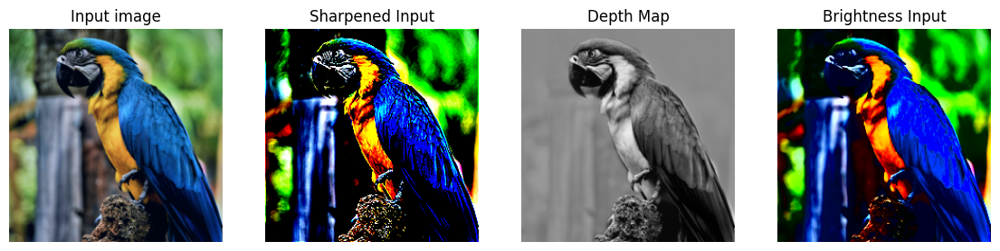

In [22]:
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 4, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(imsc(relax1.sharp_input[0].cpu()))
ax2.axis('off')
ax2.set_title(f'Sharpened Input')

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(imsc(relax1.depth_input[0].cpu()))
ax3.axis('off')
ax3.set_title(f'Depth Map')

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(imsc(relax1.bright_input[0].cpu()))
ax4.axis('off')
ax4.set_title(f'Brightness Input')
plt.show()

Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master
Using cache found in /root/.cache/torch/hub/rwightman_gen-efficientnet-pytorch_master


Loading weights:  None


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


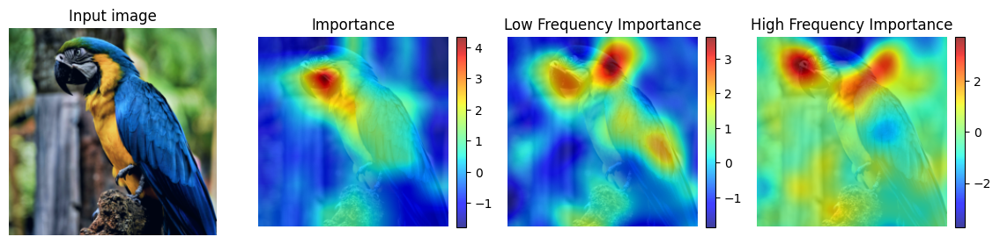

In [23]:
img = img1
encoder1 = swav
relax2 = RELAX_All(img, encoder1)
with torch.no_grad(): relax2.forward()
    
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 4, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(imsc(img[0].cpu()))
im2 = plt.imshow(relax2.importance.numpy(force=True), alpha=0.75, cmap='jet')
ax2.axis('off')
ax2.set_title(f'Importance')
plt.colorbar(im2, fraction=0.046, pad=0.04)

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(imsc(img[0].cpu()))
im3 = plt.imshow(relax2.low_freq_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax3.axis('off')
ax3.set_title(f'Low Frequency Importance')
plt.colorbar(im3, fraction=0.046, pad=0.04)

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(imsc(img[0].cpu()))
im4 = plt.imshow(relax2.high_freq_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax4.axis('off')
ax4.set_title(f'High Frequency Importance')
plt.colorbar(im4, fraction=0.046, pad=0.04)

# timestr = time.strftime("%Y%m%d-%H%M%S")
    
# plt.savefig("importance_"+timestr+".png")  
plt.show()

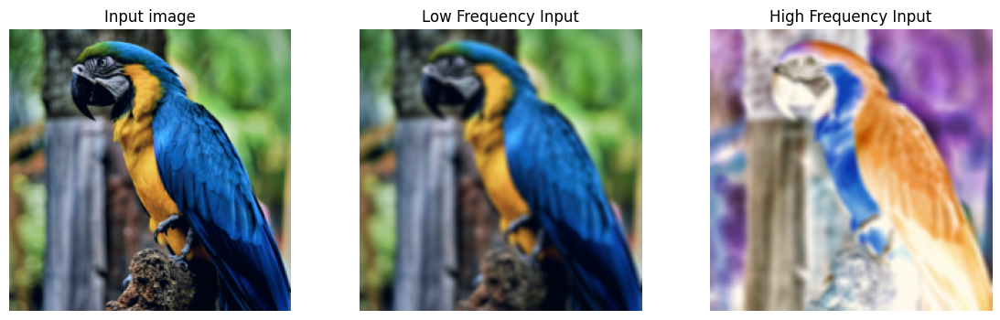

In [71]:
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 3, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 3, 2)
ax2.imshow(imsc(relax2.low_freq_input[0].cpu()))
ax2.axis('off')
ax2.set_title(f'Low Frequency Input')

ax3 = fig.add_subplot(1, 3, 3)
ax3.imshow(imsc(relax2.high_freq_input[0].cpu()))
ax3.axis('off')
ax3.set_title(f'High Frequency Input')
plt.savefig("Low-Pass and High-Pass Filtered.png")  
plt.show()

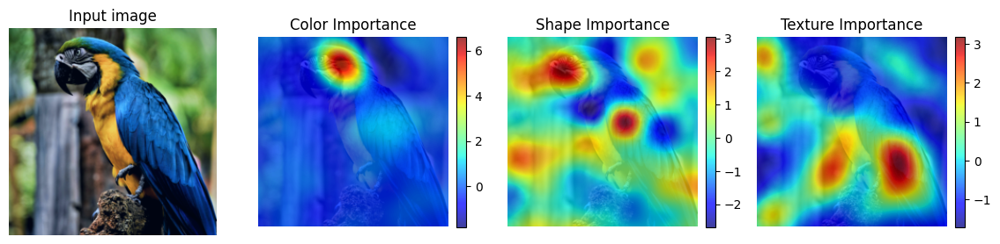

In [25]:
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 4, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(imsc(img[0].cpu()))
im2 = plt.imshow(relax2.color_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax2.axis('off')
ax2.set_title(f'Color Importance')
plt.colorbar(im2, fraction=0.046, pad=0.04)

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(imsc(img[0].cpu()))
im3 = plt.imshow(relax2.shape_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax3.axis('off')
ax3.set_title(f'Shape Importance')
plt.colorbar(im3, fraction=0.046, pad=0.04)

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(imsc(img[0].cpu()))
im4 = plt.imshow(relax2.texture_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax4.axis('off')
ax4.set_title(f'Texture Importance')
plt.colorbar(im4, fraction=0.046, pad=0.04)

# timestr = time.strftime("%Y%m%d-%H%M%S")
    
# plt.savefig("importance_"+timestr+".png")  
plt.show()

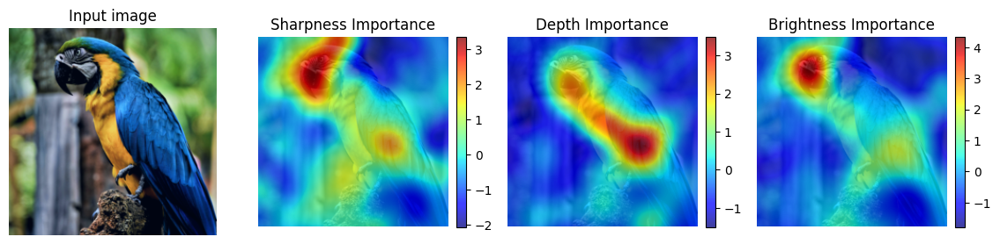

In [26]:
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 4, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(imsc(img[0].cpu()))
im2 = plt.imshow(relax2.sharp_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax2.axis('off')
ax2.set_title(f'Sharpness Importance')
plt.colorbar(im2, fraction=0.046, pad=0.04)

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(imsc(img[0].cpu()))
im3 = plt.imshow(relax2.depth_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax3.axis('off')
ax3.set_title(f'Depth Importance')
plt.colorbar(im3, fraction=0.046, pad=0.04)

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(imsc(img[0].cpu()))
im4 = plt.imshow(relax2.bright_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax4.axis('off')
ax4.set_title(f'Brightness Importance')
plt.colorbar(im4, fraction=0.046, pad=0.04)

# timestr = time.strftime("%Y%m%d-%H%M%S")
    
# plt.savefig("importance_"+timestr+".png")  
plt.show()

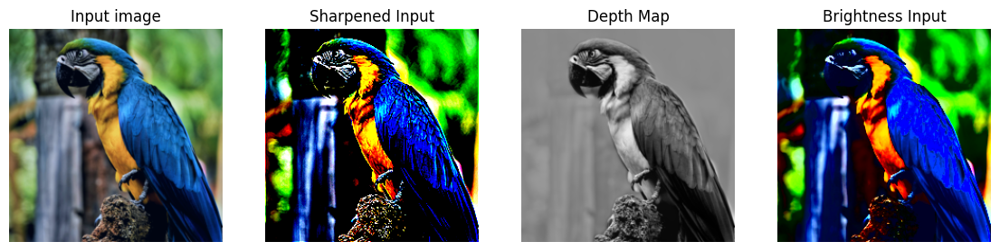

In [27]:
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 4, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(imsc(relax2.sharp_input[0].cpu()))
ax2.axis('off')
ax2.set_title(f'Sharpened Input')

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(imsc(relax2.depth_input[0].cpu()))
ax3.axis('off')
ax3.set_title(f'Depth Map')

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(imsc(relax2.bright_input[0].cpu()))
ax4.axis('off')
ax4.set_title(f'Brightness Input')
plt.show()

Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master
Using cache found in /root/.cache/torch/hub/rwightman_gen-efficientnet-pytorch_master


Loading weights:  None


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


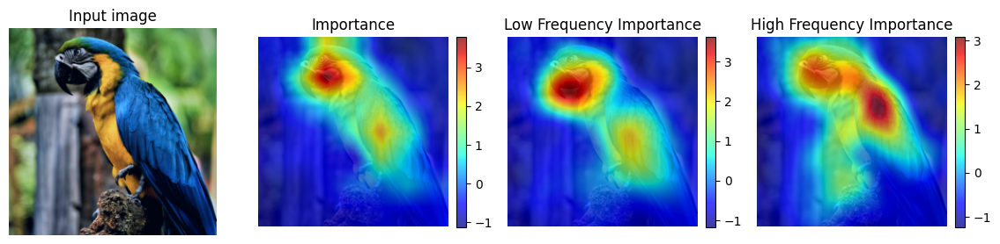

In [28]:
img = img1
encoder1 = moco
relax3 = RELAX_All(img, encoder1)
with torch.no_grad(): relax3.forward()
    
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 4, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(imsc(img[0].cpu()))
im2 = plt.imshow(relax3.importance.numpy(force=True), alpha=0.75, cmap='jet')
ax2.axis('off')
ax2.set_title(f'Importance')
plt.colorbar(im2, fraction=0.046, pad=0.04)

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(imsc(img[0].cpu()))
im3 = plt.imshow(relax3.low_freq_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax3.axis('off')
ax3.set_title(f'Low Frequency Importance')
plt.colorbar(im3, fraction=0.046, pad=0.04)

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(imsc(img[0].cpu()))
im4 = plt.imshow(relax3.high_freq_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax4.axis('off')
ax4.set_title(f'High Frequency Importance')
plt.colorbar(im4, fraction=0.046, pad=0.04)

# timestr = time.strftime("%Y%m%d-%H%M%S")
    
# plt.savefig("importance_"+timestr+".png")  
plt.show()

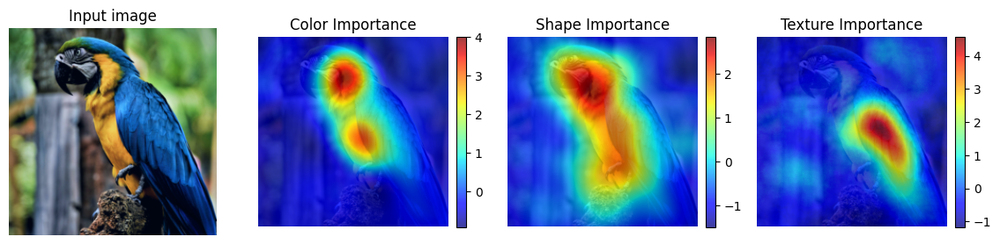

In [29]:
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 4, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(imsc(img[0].cpu()))
im2 = plt.imshow(relax3.color_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax2.axis('off')
ax2.set_title(f'Color Importance')
plt.colorbar(im2, fraction=0.046, pad=0.04)

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(imsc(img[0].cpu()))
im3 = plt.imshow(relax3.shape_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax3.axis('off')
ax3.set_title(f'Shape Importance')
plt.colorbar(im3, fraction=0.046, pad=0.04)

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(imsc(img[0].cpu()))
im4 = plt.imshow(relax3.texture_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax4.axis('off')
ax4.set_title(f'Texture Importance')
plt.colorbar(im4, fraction=0.046, pad=0.04)

# timestr = time.strftime("%Y%m%d-%H%M%S")
    
# plt.savefig("importance_"+timestr+".png")  
plt.show()

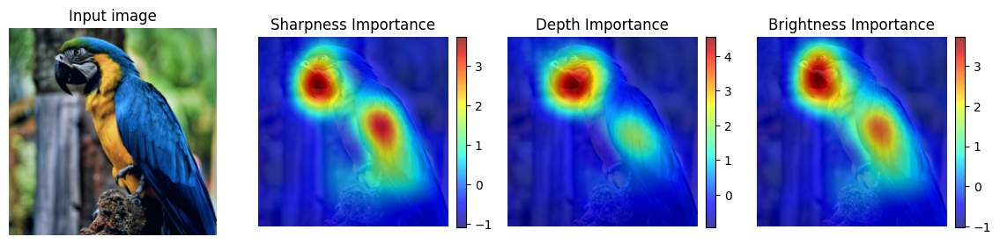

In [30]:
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 4, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(imsc(img[0].cpu()))
im2 = plt.imshow(relax3.sharp_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax2.axis('off')
ax2.set_title(f'Sharpness Importance')
plt.colorbar(im2, fraction=0.046, pad=0.04)

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(imsc(img[0].cpu()))
im3 = plt.imshow(relax3.depth_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax3.axis('off')
ax3.set_title(f'Depth Importance')
plt.colorbar(im3, fraction=0.046, pad=0.04)

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(imsc(img[0].cpu()))
im4 = plt.imshow(relax3.bright_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax4.axis('off')
ax4.set_title(f'Brightness Importance')
plt.colorbar(im4, fraction=0.046, pad=0.04)

# timestr = time.strftime("%Y%m%d-%H%M%S")
    
# plt.savefig("importance_"+timestr+".png")  
plt.show()

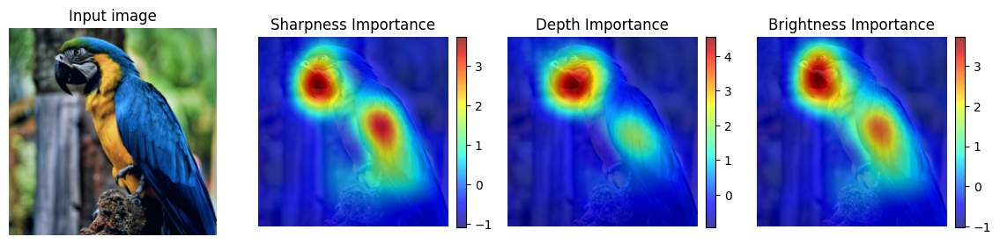

In [31]:
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 4, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(imsc(img[0].cpu()))
im2 = plt.imshow(relax3.sharp_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax2.axis('off')
ax2.set_title(f'Sharpness Importance')
plt.colorbar(im2, fraction=0.046, pad=0.04)

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(imsc(img[0].cpu()))
im3 = plt.imshow(relax3.depth_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax3.axis('off')
ax3.set_title(f'Depth Importance')
plt.colorbar(im3, fraction=0.046, pad=0.04)

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(imsc(img[0].cpu()))
im4 = plt.imshow(relax3.bright_importance.numpy(force=True), alpha=0.75, cmap='jet')
ax4.axis('off')
ax4.set_title(f'Brightness Importance')
plt.colorbar(im4, fraction=0.046, pad=0.04)

# timestr = time.strftime("%Y%m%d-%H%M%S")
    
# plt.savefig("importance_"+timestr+".png")  
plt.show()

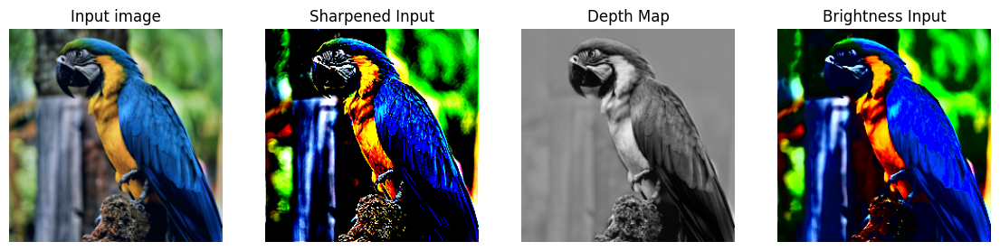

In [70]:
fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(1, 4, 1)
im1 = ax1.imshow(imsc(img[0].cpu()))
ax1.axis('off')
ax1.set_title('Input image')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(imsc(relax3.sharp_input[0].cpu()))
ax2.axis('off')
ax2.set_title(f'Sharpened Input')

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(imsc(relax3.depth_input[0].cpu()))
ax3.axis('off')
ax3.set_title(f'Depth Map')

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(imsc(relax3.bright_input[0].cpu()))
ax4.axis('off')
ax4.set_title(f'Brightness Input')

plt.savefig("Sharpened, Depth and Brightened Maps.png")  
plt.show()

In [36]:
importance_maps = {
    'SimCLR': {},
    'SwAV': {},
    'MoCo': {}
}

# Fill values for SimCLR
importance_maps['SimCLR']['Importance'] = relax1.importance.numpy(force=True)
importance_maps['SimCLR']['Color Importance'] = relax1.color_importance.numpy(force=True)
importance_maps['SimCLR']['Shape Importance'] = relax1.shape_importance.numpy(force=True)
importance_maps['SimCLR']['Texture Importance'] = relax1.texture_importance.numpy(force=True)
importance_maps['SimCLR']['Low Frequency'] = relax1.low_freq_importance.numpy(force=True)
importance_maps['SimCLR']['High Frequency'] = relax1.high_freq_importance.numpy(force=True)
importance_maps['SimCLR']['Brightness'] = relax1.bright_importance.numpy(force=True)
importance_maps['SimCLR']['Depth'] = relax1.depth_importance.numpy(force=True)
importance_maps['SimCLR']['Sharpness'] = relax1.sharp_importance.numpy(force=True)

# Fill values for SwAV
importance_maps['SwAV']['Importance'] = relax2.importance.numpy(force=True)
importance_maps['SwAV']['Color Importance'] = relax2.color_importance.numpy(force=True)
importance_maps['SwAV']['Shape Importance'] = relax2.shape_importance.numpy(force=True)
importance_maps['SwAV']['Texture Importance'] = relax2.texture_importance.numpy(force=True)
importance_maps['SwAV']['Low Frequency'] = relax2.low_freq_importance.numpy(force=True)
importance_maps['SwAV']['High Frequency'] = relax2.high_freq_importance.numpy(force=True)
importance_maps['SwAV']['Brightness'] = relax2.bright_importance.numpy(force=True)
importance_maps['SwAV']['Depth'] = relax2.depth_importance.numpy(force=True)
importance_maps['SwAV']['Sharpness'] = relax2.sharp_importance.numpy(force=True)

# Fill values for MoCo
importance_maps['MoCo']['Importance'] = relax3.importance.numpy(force=True)
importance_maps['MoCo']['Color Importance'] = relax3.color_importance.numpy(force=True)
importance_maps['MoCo']['Shape Importance'] = relax3.shape_importance.numpy(force=True)
importance_maps['MoCo']['Texture Importance'] = relax3.texture_importance.numpy(force=True)
importance_maps['MoCo']['Low Frequency'] = relax3.low_freq_importance.numpy(force=True)
importance_maps['MoCo']['High Frequency'] = relax3.high_freq_importance.numpy(force=True)
importance_maps['MoCo']['Brightness'] = relax3.bright_importance.numpy(force=True)
importance_maps['MoCo']['Depth'] = relax3.depth_importance.numpy(force=True)
importance_maps['MoCo']['Sharpness'] = relax3.sharp_importance.numpy(force=True)

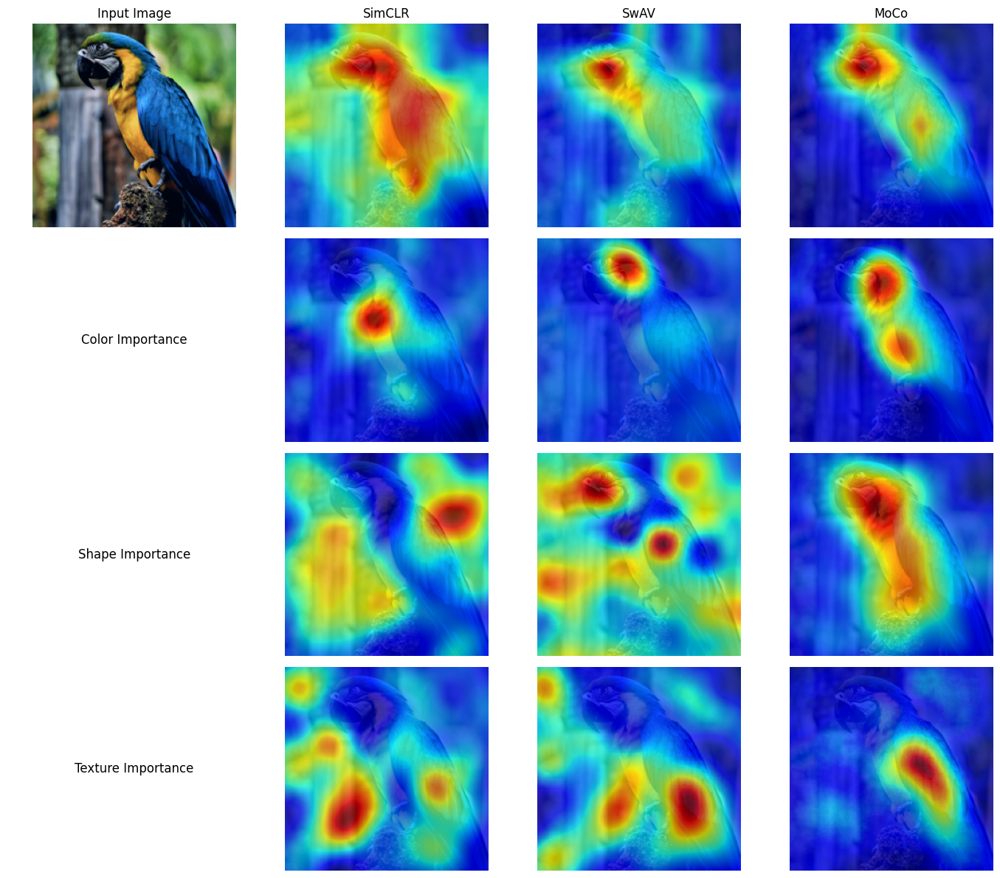

In [66]:
import matplotlib.pyplot as plt

# Example placeholders
models = ['SimCLR', 'SwAV', 'MoCo']
components = ['Color Importance', 'Shape Importance', 'Texture Importance']

relaxes = [relax1, relax2, relax3]
input_image=img1

# Assume you have input_image and importance_maps[model][component] as numpy arrays
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(14, 12))

# Row 0: Input image and general importance maps
axes[0, 0].imshow(imsc(input_image[0].cpu()))
axes[0, 0].set_title("Input Image")
axes[0, 0].axis("off")

for j, model in enumerate(models):
    axes[0, j+1].imshow(imsc(input_image[0].cpu()))
    axes[0, j+1].imshow(importance_maps[model]['Importance'], alpha=0.75, cmap='jet')
    axes[0, j+1].set_title(model)
    axes[0, j+1].axis("off")

# Rows 1–3: Color, Shape, Texture
for i, component in enumerate(components):
    axes[i+1, 0].text(0.5, 0.5, f"{component}", fontsize=12, ha='center', va='center')
    axes[i+1, 0].axis("off")
    for j, model in enumerate(models):
        axes[i+1, j+1].imshow(imsc(input_image[0].cpu()))
        axes[i+1, j+1].imshow(importance_maps[model][component], alpha=0.75, cmap='jet')
        axes[i+1, j+1].axis("off")

plt.tight_layout()
plt.savefig("Perceptual Components Importance Using RELAX.png")  
plt.show()


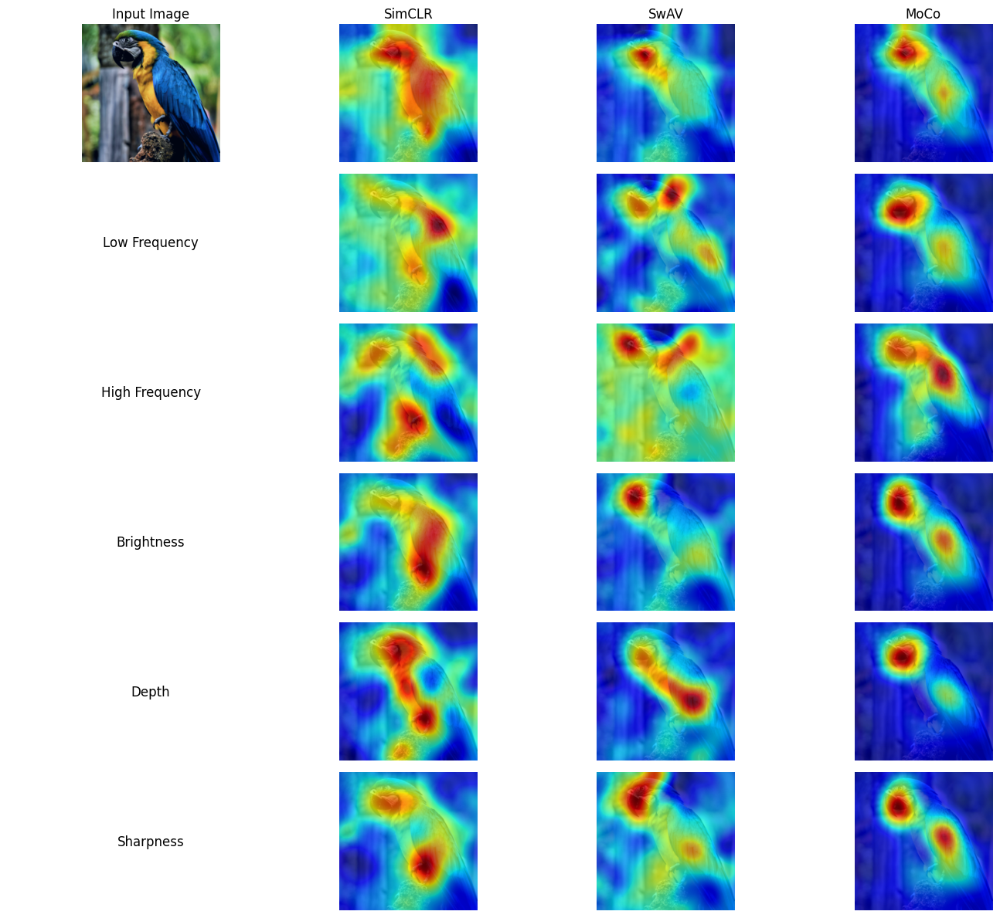

In [69]:
import matplotlib.pyplot as plt

# Example placeholders
models = ['SimCLR', 'SwAV', 'MoCo']
components = ['Low Frequency', 'High Frequency', 'Brightness', 'Depth', 'Sharpness']

relaxes = [relax1, relax2, relax3]
input_image=img1

# Assume you have input_image and importance_maps[model][component] as numpy arrays
fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(14, 12))

# Row 0: Input image and general importance maps
axes[0, 0].imshow(imsc(input_image[0].cpu()))
axes[0, 0].set_title("Input Image")
axes[0, 0].axis("off")

for j, model in enumerate(models):
    axes[0, j+1].imshow(imsc(input_image[0].cpu()))
    axes[0, j+1].imshow(importance_maps[model]['Importance'], alpha=0.75, cmap='jet')
    axes[0, j+1].set_title(model)
    axes[0, j+1].axis("off")

# Rows 1–3: Color, Shape, Texture
for i, component in enumerate(components):
    axes[i+1, 0].text(0.5, 0.5, f"{component}", fontsize=12, ha='center', va='center')
    axes[i+1, 0].axis("off")
    for j, model in enumerate(models):
        axes[i+1, j+1].imshow(imsc(input_image[0].cpu()))
        axes[i+1, j+1].imshow(importance_maps[model][component], alpha=0.75, cmap='jet')
        axes[i+1, j+1].axis("off")

plt.tight_layout()
plt.savefig("Perceptual Components Importance Using RELAX Extended.png")  
plt.show()
